# Projeto - Módulo 2
Integrantes: Luana Nunes, Daiane Ribeiro de Souza, Sarah David Müzel e Paulo Muraro Ferreira

# Descrição  dos Dados

Esse trablho é sobre o dataset: Heart Failure Prediction, disponivel no **kaggle** <a href="https://www.kaggle.com/andrewmvd/heart-failure-clinical-data?select=heart_failure_clinical_records_dataset.csv"> </a>.

As doenças cardiovasculares (DCVs) são a causa número 1 de morte em todo o mundo, levando cerca de 17,9 milhões de vidas a cada ano, o que representa 31% de todas as mortes em todo o mundo.
A insuficiência cardíaca é um evento comum causado por DCVs e este conjunto de dados contém 12 recursos que podem ser usados para prever a mortalidade por insuficiência cardíaca.

A maioria das doenças cardiovasculares pode ser prevenida abordando os fatores de risco comportamentais, como uso de tabaco, dieta não saudável e obesidade, sedentarismo e uso nocivo de álcool, usando estratégias para toda a população.

Pessoas com doenças cardiovasculares ou que apresentam alto risco cardiovascular (devido à presença de um ou mais fatores de risco, como hipertensão, diabetes, hiperlipidemia ou doença já estabelecida) precisam de detecção e gerenciamento precoces, em que um modelo de aprendizado de máquina pode ser de grande ajuda.

<br>

**Artigo original: Davide Chicco, Giuseppe Jurman: "Machine learning can predict survival of patients with heart failure from serum creatinine and ejection fraction alone". BMC Medical Informatics and Decision Making 20, 16 (2020).**


# Conhecendo os Dados

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.widgets import Button, RadioButtons, CheckButtons
import numpy as np
import seaborn as sns
import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objects as go

import statsmodels.api as sm
from statsmodels.formula.api import ols

from pandas_profiling import ProfileReport

import warnings
warnings.filterwarnings("ignore")

In [58]:
heart = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00519/heart_failure_clinical_records_dataset.csv")
heart.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [3]:
heart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


In [4]:
sns.pairplot(heart, hue='DEATH_EVENT');

Através de uma verificação dos dados, observa-se que:
- Não há presença de dados nulos
- que ao todo, tem-se os dados de 299 pacientes que sofreram um infarto
- foram analisados 12 fatores principais (variáveis de entrada).
- a variável resposta estudada é a morte dos pacientes que sofreram um infarto.

Os fatores análisados são:

- age: Idade dos pacientes 
- anaemia: Se os pacientes tem anemia
- creatinine_phosphokinase: Nível da enzima CPK no sangue (mcg/L)
- diabetes: Se o paciente tem diabetes
- ejection_fraction: Porcentagem de sangue saindo do coração a cada contração (porcentagem)  
- high_blood_pressure: Se o paciente tem pressão alta
- platelets: Plaquetas no sangue (quilo de plaquetas/mL)   
- serum_creatinine: Nível de creatinina sérica no sangue (mg/dL)
- serum_sodium: Nível de sódio sérico no sangue (mEq/L)       
- sex: Sexo dos pacientes (M=0 e H=1)  
- smoking: Se o paciente é fumante       
- time: Período de acompanhamento (dias)

A variável resposta análisada é:

- DEATH_EVENT: Se o paciente faleceu durante o período de acompanhamento



# Relatório dos dados

In [5]:
profile = ProfileReport(heart)

In [6]:
profile

Render HTML: 100%|██████████| 1/1 [00:04<00:00,  4.96s/it]


In [7]:
# salvando o relatório no disco
profile.to_file(output_file="Relatorio - Dataset Heart Failure.html")

Export report to file: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


## Estatistica descritiva

In [8]:
heart.describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.00000,299.000000,299.000000,299.00000,299.000000,299.00000
mean,60.833893,0.431438,581.839465,0.418060,38.083612,0.351171,263358.029264,1.39388,136.625418,0.648829,0.32107,130.260870,0.32107
std,11.894809,0.496107,970.287881,0.494067,11.834841,0.478136,97804.236869,1.03451,4.412477,0.478136,0.46767,77.614208,0.46767
min,40.000000,0.000000,23.000000,0.000000,14.000000,0.000000,25100.000000,0.50000,113.000000,0.000000,0.00000,4.000000,0.00000
25%,51.000000,0.000000,116.500000,0.000000,30.000000,0.000000,212500.000000,0.90000,134.000000,0.000000,0.00000,73.000000,0.00000
50%,60.000000,0.000000,250.000000,0.000000,38.000000,0.000000,262000.000000,1.10000,137.000000,1.000000,0.00000,115.000000,0.00000
75%,70.000000,1.000000,582.000000,1.000000,45.000000,1.000000,303500.000000,1.40000,140.000000,1.000000,1.00000,203.000000,1.00000
max,95.000000,1.000000,7861.000000,1.000000,80.000000,1.000000,850000.000000,9.40000,148.000000,1.000000,1.00000,285.000000,1.00000


Por meio da estatistica descritiva, observa-se que os pacientes estudados tinham:
- Idade minima = 40 anos
- Idade Média = 60 anos 
- Idade máxima = 95 anos

Sendo que 75% do dataset consiste em pacientes com menos de 70 anos.

In [9]:
# Análisando variável resposta

qtdd_vivo = len(heart[heart["DEATH_EVENT"] == 0]) # determinar a quantidade de pacientes vivos
qtdd_mortos= len(heart[heart['DEATH_EVENT'] == 1])  # determinar a quantidade de pacientes que faleceram

print(f'Quantidade de pacientes que sobreviveram:{qtdd_vivo}\nQuantidade de pacientes que faleceram: {qtdd_mortos}')

Quantidade de pacientes que sobreviveram:203
Quantidade de pacientes que faleceram: 96


In [10]:
sns.set() 
plt.figure (figsize= (8,5)) 

fig_mortes= sns.countplot(data=heart, x=heart["DEATH_EVENT"])

for p, label in zip(fig_mortes.patches, heart['DEATH_EVENT'].value_counts()):  # para add os rótulos nas barras
    fig_mortes.annotate(label, (p.get_x()+0.375, p.get_height()+0.15))
    
    
fig_mortes.set_title('Pacientes Vivos e Mortos', fontsize = 16)# nome do título
fig_mortes.set_ylabel('Quantidade', fontsize=14, fontweight = 'bold') # titulo do eixo y
fig_mortes.set_xlabel('Pacientes', fontsize=16, fontweight = 'bold') # titulo do eixo x

plt.show()


In [11]:
# Criando um gráfico de pizza para ver a distribuição dos dados

fig_porcentagem_mortes = heart['DEATH_EVENT'].value_counts()
plt.figure (figsize= (7,8)) # função do matplotlib que muda o tamanho da imagem
labels = ['Pacientes que sobreviveram', 'Pacientes que faleceram'] # colocar o nome em cada fatia
plt.axis ('equal') # para o gráfico sair circular e não oval
plt.title ('Porcentagem de pacientes que faleceram', fontsize=18)  # titulo do gráfico
explode = [0.01, 0] # deixar uma parte em evidencia

# autopct -> mostra os valores em %
plt.pie(fig_porcentagem_mortes, labels=labels, explode = explode, textprops={'fontsize': 15},autopct='%1.1f%%')
plt.show()

Analisando o dataset, verifica-se que dentre os 299 pacientes que sofreram infarto, 96 pacientes foram ao obito, o que representa aproximadamente 32% do total de pacientes.

# Análisando os óbitos ocorridos

Nesse estudo foram levantos 12 fatores  para compreender a relação dos infartos como hábitos (fumar), condições clinicas ( pressão sanguinea, anemia, etc) e sexo, idade, dentre outros.

## Idade

Análisando a idades dos pacientes infartados

In [12]:
# convertendo o tipo de dado da coluna age para inteiro
heart = heart.astype({"age": int})

In [13]:
# crinado um gráfico para facilitar a vidualização das idades mais recorrentes

sns.set() # para trazer as confirgurações padrão do gráfico do seaborn que o colab não está importando
plt.figure (figsize= (20, 10)) # função do matplotlib que muda o tamanho da imagem

fig_age= sns.countplot (data= heart, x= heart['age'], order=heart['age'].value_counts().index) # criar gráfico

for p, label in zip(fig_age.patches, heart['age'].value_counts()):  # para add os rótulos nas barras
    fig_age.annotate(label, (p.get_x()+0.375, p.get_height()+0.15))


fig_age.set_title('As idades mais recorrentes dos pacientes', fontsize = 16)# nome do título
fig_age.set_ylabel('Quantidade', fontsize=14, fontweight = 'bold') # titulo do eixo y
fig_age.set_xlabel('Idades', fontsize=16, fontweight = 'bold') # titulo do eixo x


plt.show()

In [14]:
# Histograma para compreender melhor a distribuição das idades 

fig_hist_age = px.histogram(heart, x=heart['age'], nbins=200)
fig_hist_age.show()

Para compreender melhor a distribuição das faixas etárias dentro do grupo de pacientes análisado, os dados foram dividios em 5 grupos de idade.

In [15]:
heart['grupos_idades'] = pd.qcut(heart.age, 5)
heart.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT,grupos_idades
0,75,0,582,0,20,1,265000.00,1.9,130,1,0,4,1,"(70.0, 95.0]"
1,55,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1,"(50.0, 58.0]"
2,65,0,146,0,20,0,162000.00,1.3,129,1,1,7,1,"(63.0, 70.0]"
3,50,1,111,0,20,0,210000.00,1.9,137,1,0,7,1,"(39.999, 50.0]"
4,65,1,160,1,20,0,327000.00,2.7,116,0,0,8,1,"(63.0, 70.0]"


In [16]:
# verifiando os grupos criados e a quantidade de pacientes dentro de cada grupo
heart['grupos_idades'].value_counts()

(39.999, 50.0]    74
(63.0, 70.0]      66
(58.0, 63.0]      56
(70.0, 95.0]      52
(50.0, 58.0]      51
Name: grupos_idades, dtype: int64

In [17]:
# análisando a porcentagem de mortes dentro de cada grupo etário
morte_por_idade = heart.groupby(['grupos_idades'])[['DEATH_EVENT']].apply(lambda x: x.sum()/heart[['DEATH_EVENT']].sum())
(morte_por_idade*100).style.format('{0:,.1f}%')

,DEATH_EVENT
grupos_idades,
"(39.999, 50.0]",19.8%
"(50.0, 58.0]",9.4%
"(58.0, 63.0]",18.8%
"(63.0, 70.0]",19.8%
"(70.0, 95.0]",32.3%


É possivel observar, a maioria dos óbitos ocorreu no grupo entre 70 e 95 anos de idade.

In [18]:
legenda = ['Sobrevintes', 'Falecidos']
fig1_hist_age=px.histogram(data_frame=heart,x="age",nbins=120,title="Idades dos pacientes que faleceram/sobreviveram",color="DEATH_EVENT")
fig1_hist_age.show()

## Fumantes

In [19]:
qtd_fumantes = heart['smoking'].sum() # determinar a quantidade de fumantes
qtd_nao_fumantes = (heart['smoking'] == 0).sum() # determinar a quantidade de não fumantes

fumantes_mortos = len(heart[(heart['smoking']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de fumantes que faleceram
fumantes_nao_mortos = len(heart[(heart['smoking']==1) & (heart['DEATH_EVENT']==0)]) # determinar a quantidade de fumantes que não faleceram

print(f'Quantidade de Fumantes: {qtd_fumantes} \nQuantidade de não-fumantes: {qtd_nao_fumantes}')
print(f'Quantidade de fumantes que faleceram: {fumantes_mortos} \nQuantidade fumantes que não faleceram: {fumantes_nao_mortos} ')


Quantidade de Fumantes: 96 
Quantidade de não-fumantes: 203
Quantidade de fumantes que faleceram: 30 
Quantidade fumantes que não faleceram: 66 


In [20]:
# % de pacientes fumantes

fumantes = heart['smoking'].value_counts()
plt.figure (figsize= (8, 6)) 
labels = ['não fumante', 'fumante'] 
plt.axis ('equal') 
plt.title ('Porcentagem de fumantes dentro de todos os pacientes anáisados', fontsize=16)  
explode = [0.01, 0] # deixar uma parte em evidencia

plt.pie(fumantes, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

In [21]:
# % de pacientes fumantes que faleceram

fumantes2 = [fumantes_mortos, fumantes_nao_mortos]
plt.figure (figsize= (8, 6)) # função do matplotlib que muda o tamanho da imagem
labels = ['Fumantes que faleceram', 'Fumantes que sobreviveram'] # colocar o nome em cada fatia
plt.axis ('equal') # para o gráfico sair circular e não oval
plt.title ('Porcentagem de fumantes que faleceram', fontsize=20)  # titulo do gráfico
explode = [0.01, 0] # deixar uma parte em evidencia

# autopct -> mostra os valores em %
plt.pie(fumantes2, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

In [22]:
qtd_nao_fumantes_vivos = len(heart[(heart["smoking"]==0) & (heart['DEATH_EVENT']==0)]) # determinar a quantidade de não-fumantes vivos
qtd_nao_fumantes_mortos = len(heart[(heart["smoking"]==0)&(heart["DEATH_EVENT"]==1)])  # determinar a quantidade de não fumantes que faleceram

labels = ['Fumante Sobrevinte','Fumante Falecido', 'Não Fumante Sobrevivente', 'Não Fumante Falecido']
values = [fumantes_nao_mortos, fumantes_mortos, qtd_nao_fumantes_vivos,qtd_nao_fumantes_mortos]

fig_fumantes = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig_fumantes.update_layout(title_text="Análise geral de sobrevivente em função de serem fumantes ")
fig_fumantes.show()

## Pressão alta



In [23]:
qtd_hbp = heart['high_blood_pressure'].sum() # determinar a quantidade de pacientes com pressão alta
qtd_nao_hbp = (heart['high_blood_pressure'] == 0).sum() # determinar a quantidade de pacientes sem pressão alta

hbp_mortos = len(heart[(heart['high_blood_pressure']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com pressão alta que faleceram
hbp_nao_mortos = len(heart[(heart['high_blood_pressure']==1) & (heart['DEATH_EVENT']==0)]) # determinar a quantidade de pacientes sem pressão altas que não faleceram

print(f'Quantidade de pacientes com pressão alta: {qtd_hbp} \nQuantidade de pacientes sem pressão alta: {qtd_nao_hbp}')
print(f'Quantidade de pacientes com pressão alta que faleceram: {hbp_mortos} \nQuantidade pacientes com pressão alta que não faleceram: {hbp_nao_mortos} ')


Quantidade de pacientes com pressão alta: 105 
Quantidade de pacientes sem pressão alta: 194
Quantidade de pacientes com pressão alta que faleceram: 39 
Quantidade pacientes com pressão alta que não faleceram: 66 


In [24]:
# % de pacientes com pressão alta

hbp = heart['high_blood_pressure'].value_counts()
plt.figure (figsize= (8, 6)) 
labels = ['Não tem pressão alta', 'Tem pressão alta'] 
plt.axis ('equal') 
plt.title ('Porcentagem de pacientes com pressão alta dentro, entre todos os pacientes anáisados', fontsize=16)  
explode = [0.01, 0] # deixar uma parte em evidencia

plt.pie(hbp, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

In [25]:
# % de pacientes com pressão alta que faleceram

hbp2 = [hbp_mortos, hbp_nao_mortos]
plt.figure (figsize= (8, 6)) 
labels = ['Pacientes com pressão alta que faleceram', 'Pacientes com pressão alta que sobreviveram']
plt.axis ('equal') 
plt.title ('Porcentagem de pacientes com pressão alta que faleceram', fontsize=20)  
explode = [0.01, 0] 

plt.pie(hbp2, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

In [26]:
qtd_nao_hbp_vivos = len(heart[(heart["high_blood_pressure"]==0) & (heart['DEATH_EVENT']==0)]) # determinar a quantidade de pacientes com pressão alta vivos
qtd_nao_hbp_mortos = len(heart[(heart["high_blood_pressure"]==0)&(heart["DEATH_EVENT"]==1)])  # determinar a quantidade de pacientes sem pressão alta que faleceram

labels = ['Com pressão alta Sobrevinte','Com pressão alta Falecido', 'Sem pressão alta Sobrevivente', 'Sem pressão alta Falecido']
values = [hbp_nao_mortos, hbp_mortos, qtd_nao_hbp_vivos,qtd_nao_hbp_mortos]

fig_hbp = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig_hbp.update_layout(title_text="Análise geral de sobrevivente em função de ter pressão alta ")
fig_hbp.show()

## Diabetes

In [27]:
qtd_diabeticos = heart['diabetes'].sum() #determinar a quantidade de pacientes com diabetes
qtd_nao_diabeticos = (heart['diabetes'] == 0).sum() # determinar a quantidade de pacientes sem diabetes

diabeticos_mortos = len(heart[(heart['diabetes']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com diabetes que faleceram
diabeticos_nao_mortos = len(heart[(heart['diabetes']==1) & (heart['DEATH_EVENT']==0)])# determinar a quantidade de pacientes sem diabetes que não faleceram

print(f'Quantidade de pacientes com diabetes: {qtd_diabeticos} \nQuantidade de pacientes sem diabetes: {qtd_nao_diabeticos}')
print(f'Quantidade de pacientes com diabetes que faleceram: {diabeticos_mortos} \nQuantidade pacientes com diabetes que não faleceram: {diabeticos_nao_mortos}')


Quantidade de pacientes com diabetes: 125 
Quantidade de pacientes sem diabetes: 174
Quantidade de pacientes com diabetes que faleceram: 40 
Quantidade pacientes com diabetes que não faleceram: 85


In [28]:
# % de pacientes com diabetes

diabeticos = heart['diabetes'].value_counts()
plt.figure (figsize= (8, 6)) 
labels = ['Não tem diabetes', 'Tem diabetes'] 
plt.axis ('equal') 
plt.title ('Porcentagem de pacientes com diabetes, dentro todos os pacientes anáisados', fontsize=16)  
explode = [0.01, 0] # deixar uma parte em evidencia

plt.pie(diabeticos, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

In [29]:
# % de pacientes com diabetes que faleceram

diabeticos2 = [diabeticos_mortos, diabeticos_nao_mortos]
plt.figure (figsize= (8, 6)) 
labels = ['Diabeticos que faleceram', 'Diabeticos que sobreviveram']
plt.axis ('equal') 
plt.title ('Porcentagem de pacientes com pressão alta que faleceram', fontsize=20)  
explode = [0.01, 0] 

plt.pie(diabeticos2, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

In [30]:
qtd_nao_diabetico_vivos = len(heart[(heart["diabetes"]==0) & (heart['DEATH_EVENT']==0)]) # determinar a quantidade de pacientes com pressão alta vivos
qtd_nao_diabetico_mortos = len(heart[(heart["diabetes"]==0)&(heart["DEATH_EVENT"]==1)])  # determinar a quantidade de pacientes sem pressão alta que faleceram

labels = ['Com diabetes Sobrevinte','Com diabetes Falecido', 'Sem diabetes Sobrevivente', 'Sem diabetes Falecido']
values = [diabeticos_nao_mortos, diabeticos_mortos, qtd_nao_diabetico_vivos, qtd_nao_diabetico_mortos]

fig_diabetes = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig_diabetes.update_layout(title_text="Análise geral de sobrevivente em função de ter diabetes ")
fig_diabetes.show()

## Sexo

In [31]:
heart['sex'].value_counts()

1    194
0    105
Name: sex, dtype: int64

In [32]:
qtd_H = (heart['sex'] ==1).sum() #determinar a quantidade de pacientes homens
qtd_M = (heart['sex'] == 0).sum() # determinar a quantidade de pacientes mulheres

H_mortos = len(heart[(heart['sex']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com diabetes que faleceram
M_mortos = len(heart[(heart['sex']==0) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com diabetes que faleceram

H_nao_mortos = len(heart[(heart['sex']==1) & (heart['DEATH_EVENT']==0)])# determinar a quantidade de pacientes sem diabetes que não faleceram
M_nao_mortos = len(heart[(heart['sex']==0) & (heart['DEATH_EVENT']==0)])# determinar a quantidade de pacientes sem diabetes que não faleceram

print(f'Quantidade de pacientes homens: {qtd_H} \nQuantidade de pacientes mulheres: {qtd_M}')
print(f'Quantidade de pacientes homens que faleceram: {H_mortos} \nQuantidade pacientes homens que não faleceram: {H_nao_mortos}')
print(f'Quantidade de pacientes mulheres que faleceram: {M_mortos} \nQuantidade pacientes mulheres que não faleceram: {M_nao_mortos}')


Quantidade de pacientes homens: 194 
Quantidade de pacientes mulheres: 105
Quantidade de pacientes homens que faleceram: 62 
Quantidade pacientes homens que não faleceram: 132
Quantidade de pacientes mulheres que faleceram: 34 
Quantidade pacientes mulheres que não faleceram: 71


In [33]:
# % de pacientes por sexo

sexo = heart['sex'].value_counts()
plt.figure (figsize= (8, 6)) 
labels = ['Homens', 'Mulheres'] 
plt.axis ('equal') 
plt.title ('Distribuição dos pacientes por sexo', fontsize=16)  
explode = [0.01, 0] # deixar uma parte em evidencia
plt.pie(sexo, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

In [34]:
homens = [H_mortos, H_nao_mortos]
mulheres = [M_mortos, M_nao_mortos]

fig_sexo, ax = plt.subplots(1,2,figsize=(15, 8))
plt.suptitle('Porcentagem de falecimento por sexo', fontsize=20, fontweight='bold')
plt.axis ('equal') 
explode = [0.01, 0] 

label_H = ['Homens-faleceu', 'Homens-sobreviveu']
label_M = ['Mulheres-faleceu', 'Mulheres-sobreviveu']

ax[0].pie(homens, labels=label_H, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
ax[1].pie(mulheres, labels=label_M, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')

plt.show()   

In [35]:
labels = ['Homens-faleceu','Homens-sobreviveu', 'Mulheres-faleceu', 'Mulheres-sobreviveu']
values = [H_mortos, H_nao_mortos, M_mortos, M_nao_mortos]

fig_sex3 = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig_sex3.update_layout(title_text="Análise geral de sobrevivente em função do sexo ")
fig_sex3.show()

## Anemia

In [36]:
qtd_anemicos = heart['anaemia'].sum() #determinar a quantidade de pacientes com diabetes
qtd_nao_anemicos = (heart['anaemia'] == 0).sum() # determinar a quantidade de pacientes sem diabetes

anemicos_mortos = len(heart[(heart['anaemia']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com diabetes que faleceram
anemicos_nao_mortos = len(heart[(heart['anaemia']==1) & (heart['DEATH_EVENT']==0)])# determinar a quantidade de pacientes sem diabetes que não faleceram

print(f'Quantidade de pacientes com anemia: {qtd_anemicos} \nQuantidade de pacientes sem anemia: {qtd_nao_anemicos}')
print(f'Quantidade de pacientes com anemia que faleceram: {anemicos_mortos} \nQuantidade pacientes com anemia que não faleceram: {anemicos_nao_mortos}')


Quantidade de pacientes com anemia: 129 
Quantidade de pacientes sem anemia: 170
Quantidade de pacientes com anemia que faleceram: 46 
Quantidade pacientes com anemia que não faleceram: 83


In [56]:
# % de pacientes com anemia

anemicos = heart['anaemia'].value_counts()
plt.figure (figsize= (8, 6)) 
labels = ['Não tem anemia', 'Tem anemia'] 
plt.axis ('equal') 
plt.title ('Porcentagem de pacientes com anemia, dentro todos os pacientes anáisados', fontsize=16)  
explode = [0.01, 0] # deixar uma parte em evidencia

plt.pie(diabeticos, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

In [55]:
# % de pacientes com anemia que faleceram

diabeticos2 = [anemicos_mortos, anemicos_nao_mortos]
plt.figure (figsize= (8, 6)) 
labels = ['Anemicos que faleceram', 'Anemicos que sobreviveram']
plt.axis ('equal') 
plt.title ('Porcentagem de pacientes com anemia que faleceram', fontsize=16)  
explode = [0.01, 0] 

plt.pie(diabeticos2, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

In [ ]:
qtd_nao_anemico_vivos = len(heart[(heart["anaemia"]==0) & (heart['DEATH_EVENT']==0)]) # determinar a quantidade de pacientes com pressão alta vivos
qtd_nao_anemico_mortos = len(heart[(heart["anaemia"]==0)&(heart["DEATH_EVENT"]==1)])  # determinar a quantidade de pacientes sem pressão alta que faleceram

labels = ['Com anemia Sobrevinte','Com anemia  Falecido', 'Sem anemia  Sobrevivente', 'Sem anemia  Falecido']
values = [diabeticos_nao_mortos, diabeticos_mortos, qtd_nao_diabetico_vivos, qtd_nao_diabetico_mortos]

fig_diabetes = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig_diabetes.update_layout(title_text="Análise geral de sobrevivente em função de ter anemia  ")
fig_diabetes.show()

## creatinine_phosphokinase

In [ ]:
heart.creatinine_phosphokinase.value_counts()

582     47
129      4
66       4
47       3
64       3
        ..
1688     1
154      1
156      1
159      1
1021     1
Name: creatinine_phosphokinase, Length: 208, dtype: int64

In [ ]:
heart['creatinine_phosphokinase'].describe()

count     299.000000
mean      581.839465
std       970.287881
min        23.000000
25%       116.500000
50%       250.000000
75%       582.000000
max      7861.000000
Name: creatinine_phosphokinase, dtype: float64

In [ ]:
# marginal= "rug", # can be `box`, `violin`

fig_hist_CPK = px.histogram(heart, x=heart['creatinine_phosphokinase'], nbins=70, marginal="box")
fig_hist_CPK.show()

In [ ]:
hist2_CPK=px.histogram(heart,x="creatinine_phosphokinase",nbins=60,color="DEATH_EVENT",height=500,width = 900,marginal="violin")
hist2_CPK.show()

In [ ]:
CPK_vive = heart[heart['DEATH_EVENT']==0]['creatinine_phosphokinase']
CPK_morre = heart[heart['DEATH_EVENT']==1]['creatinine_phosphokinase']

dados_distribuicao_age = [CPK_vive, CPK_morre]

legenda = ['Sobrevintes', 'Falecidos']
fig1_distribuicao_age = ff.create_distplot(dados_distribuicao_age, legenda, bin_size=0.5)


fig1_distribuicao_age.update_layout(
    title_text="Frequência dos pacientes que faleceram em função do nível da enzima CPK no sangue (mcg/L)")
fig1_distribuicao_age.show()

## ejection_fraction

In [ ]:
heart.ejection_fraction.value_counts()

35    49
38    40
40    37
25    36
30    34
60    31
50    21
45    20
20    18
55     3
17     2
15     2
62     2
70     1
14     1
65     1
80     1
Name: ejection_fraction, dtype: int64

In [ ]:
heart['ejection_fraction'].describe()

count    299.000000
mean      38.083612
std       11.834841
min       14.000000
25%       30.000000
50%       38.000000
75%       45.000000
max       80.000000
Name: ejection_fraction, dtype: float64

In [ ]:
fig_hist_ef = px.histogram(heart, x=heart['ejection_fraction'], nbins=30, marginal="box")
fig_hist_ef.show()

In [ ]:
ef=px.histogram(heart,x="ejection_fraction",nbins=30,color="DEATH_EVENT", marginal="violin")
ef.show()

In [ ]:
fig_ef = px.pie(heart, values="DEATH_EVENT",names="ejection_fraction",
                title='Porcentagem de mrtes em função da enjeção de sangue', width=900, height=700)
fig_ef.show()

## esse gráfico é basivamente a mesma coisa do Go, mas nesse aprece o nome label, 
## que no caso como aqui estamos com a coluna direto não é tão ruim 

## platelets

In [ ]:
heart.platelets.value_counts()

263358.03    25
228000.00     4
226000.00     4
235000.00     4
255000.00     4
             ..
448000.00     1
337000.00     1
229000.00     1
358000.00     1
310000.00     1
Name: platelets, Length: 176, dtype: int64

In [ ]:
sc=px.histogram(heart,x="platelets",nbins=30,color="DEATH_EVENT", marginal="violin")
sc.show()

## serum_creatinine

In [ ]:
heart.serum_creatinine.value_counts()

1.00    50
1.10    32
0.90    32
0.80    24
1.20    24
1.30    20
0.70    19
1.18    11
1.70     9
1.40     9
1.83     8
1.60     6
2.10     5
1.90     5
1.50     5
1.80     4
0.60     4
2.30     3
2.70     3
2.50     3
3.50     2
3.00     2
2.40     2
3.80     1
0.75     1
3.20     1
9.40     1
4.00     1
0.50     1
6.10     1
4.40     1
3.70     1
2.90     1
9.00     1
5.00     1
6.80     1
3.40     1
2.20     1
5.80     1
2.00     1
Name: serum_creatinine, dtype: int64

In [ ]:
sc=px.histogram(heart,x="serum_creatinine",nbins=30,color="DEATH_EVENT", marginal="violin")
sc.show()

## serum_sodium

In [ ]:
heart.serum_sodium.value_counts()

136    40
137    38
140    35
134    32
138    23
139    22
135    16
132    14
141    12
142    11
133    10
130     9
145     9
144     5
131     5
143     3
127     3
128     2
129     2
146     1
113     1
116     1
126     1
125     1
124     1
121     1
148     1
Name: serum_sodium, dtype: int64

In [ ]:
ss=px.histogram(heart,x="serum_sodium",nbins=30,color="DEATH_EVENT", marginal="violin")
ss.show()

## time

In [ ]:
heart.time.value_counts()

250    7
187    7
10     6
186    6
107    6
      ..
97     1
96     1
86     1
77     1
285    1
Name: time, Length: 148, dtype: int64

In [ ]:
ss=px.histogram(heart,x="time",nbins=30,color="DEATH_EVENT", marginal="violin")
ss.show()

## Correlação

- lineares (Pearson)
- monotônicos (Spearman)

### Correlação de Pearson

* O coeficiente de correlação varia de `-1` a `1`. Se valor é próximo de 1, isto significa que existe uma forte correlação positiva entre as variáveis. Quando esse número é próximo de -1, as variáveis tem uma forte correlação negativa.*

* **Resistência**: Quanto maior for o valor absoluto do coeficiente, mais forte é a relação entre as variáveis. Para a correlação de Pearson, um valor absoluto de 1 indica uma relação linear perfeita. A correlação perto de 0 indica que não há relação linear entre as variáveis.

* **Direção** : O sinal de cada coeficiente indica a direção da relação. Se ambas as variáveis tendem a aumentar ou diminuir em conjunto, o coeficiente é positivo, e a linha que representa a correlação inclina para cima. Se uma variável tende a aumentar à medida que os outras diminuem, o coeficiente é negativo, e a linha que representa a correlação inclina para baixo.

* Relação nula: Pearson r = 0
* Relação média: Pearson r ~,0,5
* Relação Forte: Pearson r > 0,9

**Considere os seguintes pontos ao interpretar o coeficiente de correlação:**
* Nunca é adequado concluir que as mudanças em uma variável causam mudanças em outra variável com base apenas na correlação. Somente experimentos adequadamente controlados permitem que você determine se uma relação é causal.

* O coeficiente de correlação de Pearson é muito sensível a valores extremos de dados. Um valor único que é muito diferente dos outros valores de um conjunto de dados pode alterar significativamente o valor do coeficiente. Você deve tentar identificar a causa de qualquer valor extremo. 

* Corrija os erros de entrada de dados ou de medição. Considere a remoção de valores de dados que estejam associados a eventos anormais que ocorrem somente uma vez (causas especiais). Em seguida, repita a análise.
Um coeficiente de correlação de Pearson baixo não significa que não existe nenhuma relação entre as variáveis. As variáveis podem ter uma relação não linear. Para verificar se há relações não-lineares graficamente, crie um Gráfico de dispersão ou use Gráfico de linha ajustada.

In [ ]:
# para facilitar a visualização dessa correlação podemos criar um gráfico usando o método heatmap seaborn
# no quai vai aparacer o valor de cada um das correlações  dentro dos quadrados.

# 1- gerando a correlação de Perason
correlacao_pearson = heart.corr()

#2- Gerando mapa heatmap
mask = np.zeros_like(correlacao_pearson)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(16,10))
    ax = sns.heatmap(correlacao_pearson, mask=mask, annot=True, vmin=-1, vmax=1,cmap="PiYG")

### Correlação de Spearman's 

A correlação de Spearman avalia a relação monotônica entre duas variáveis contínuas ou ordinais. Em uma relação monotônica, as variáveis tendem a mudar juntas mas não necessariamente a uma taxa constante. O coeficiente de correlação de Spearman baseia-se nos valores classificados de cada variável, em vez de os dados brutos.

A correlação de Spearman é muito usada para avaliar relações envolvendo variáveis ordinais. Por exemplo, você poderia usar a correlação de Spearman para avaliar se a ordem na qual os funcionários executam um teste está relacionada ao número de meses de emprego.

 Seu valor está entre -1 e +1, -1 indicando correlação monotônica negativa total, 0 indicando nenhuma correlação monotônica e 1 indicando correlação monotônica positiva total.

Para calcular ρ para duas variáveis X e Y, divide-se a covariância das variáveis de classificação de X e Y pelo produto de seus desvios-padrão.

In [42]:
'''
pearson : standard correlation coefficient
kendall : Kendall Tau correlation coefficient
spearman : Spearman rank correlation
'''

# 1- gerando a correlação de Spearman
correlacao_spearman = heart.corr(method='spearman')

#2- Gerando mapa heatmap
mask = np.zeros_like(correlacao_spearman)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(16,10))
    ax = sns.heatmap(correlacao_spearman, mask=mask, annot=True, vmin=-1, vmax=1,cmap="PiYG")

### Correlação de Kendall

A correlação de Kendall deve ser utilizada com dados ordinais de três ou mais níveis.

Na descrição do método, sem perda de generalidade, assumimos que é feita uma classificação única em cada indivíduo por cada avaliador, e existem k avaliadores por indivíduo. Então, para calcular o coeficiente de Kendall, os k avaliadores representam os k ensaios para cada avaliador.

Suponha que os dados estejam organizados em uma tabela k x N com cada linha representando as fileiras atribuídas por um avaliador específico aos indivíduos N.

Da mesma forma que o coeficiente de correlação de Spearman, o coeficiente de correlação de Kendall (τ) mede a associação ordinal entre duas variáveis. Seu valor está entre -1 e +1, -1 indicando correlação negativa total, 0 indicando nenhuma correlação e 1 indicando correlação positiva total.

Para calcular τ para duas variáveis X e Y, determina-se o número de pares concordantes e discordantes de observações. τ é dado pelo número de pares concordantes menos os pares discordantes dividido pelo número total de pares.

In [ ]:
# 1- gerando a correlação de kendall
correlacao_kendall = heart.corr(method='kendall')

#2- Gerando mapa heatmap
mask = np.zeros_like(correlacao_kendall)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(16,10))
    ax = sns.heatmap(correlacao_kendall, mask=mask, annot=True, vmin=-1, vmax=1,cmap="PiYG")

# Anova

Para saber se há uma relação siguinificativa dosdados foi realizada uma análise estatistica dos dados:

- one-way ANOVA
- two-way ANOVA


In [50]:
print ("IDADE")
age = ols('DEATH_EVENT ~ age', data = heart).fit()
aov_age = sm.stats.anova_lm(age, typ=2)
print (aov_age)
print ()

print ("ANEMIA")
anaemia = ols('DEATH_EVENT ~ anaemia', data = heart).fit()
aov_anaemia = sm.stats.anova_lm(anaemia, typ=2)
print (aov_anaemia)
print ()

print ("CPK")
cpk = ols('DEATH_EVENT ~ creatinine_phosphokinase', data = heart).fit()
aov_cpk = sm.stats.anova_lm(cpk, typ=2)
print (aov_cpk)
print ()

print ("DIABETES")
diabetes = ols('DEATH_EVENT ~ diabetes', data = heart).fit()
aov_diabetes = sm.stats.anova_lm(diabetes, typ=2)
print (aov_diabetes)
print ()

print ("ENJECTION FRACTION")
ef = ols('DEATH_EVENT ~ ejection_fraction', data = heart).fit()
aov_ef = sm.stats.anova_lm(ef, typ=2)
print (aov_ef)
print ()

print ("PRESSÃO ALTA")
hbp = ols('DEATH_EVENT ~ high_blood_pressure', data = heart).fit()
aov_hbp = sm.stats.anova_lm(hbp, typ=2)
print (aov_hbp)
print ()

print ("PLAQUETAS")
plaquetas = ols('DEATH_EVENT ~ platelets', data = heart).fit()
aov_plaquetas = sm.stats.anova_lm(plaquetas, typ=2)
print (aov_plaquetas)
print ()

print ("CREATININA")
sc = ols('DEATH_EVENT ~ serum_creatinine', data = heart).fit()
aov_sc = sm.stats.anova_lm(sc, typ=2)
print (aov_sc)
print ()

print ("SEXO")
sexo = ols('DEATH_EVENT ~ sex', data = heart).fit()
aov_sexo = sm.stats.anova_lm(sexo, typ=2)
print (aov_sexo)
print ()

print ("SÓDIO")
ss = ols('DEATH_EVENT ~ serum_sodium', data = heart).fit()
aov_ss = sm.stats.anova_lm(ss, typ=2)
print (aov_ss)
print ()

print ("FUMANTE")
fumante = ols('DEATH_EVENT ~ smoking', data = heart).fit()
aov_fumante = sm.stats.anova_lm(fumante, typ=2)
print (aov_fumante)
print ()

print ("TEMPO")
time = ols('DEATH_EVENT ~ time', data = heart).fit()
aov_time = sm.stats.anova_lm(time, typ=2)
print (aov_time)
print ()


IDADE
             sum_sq     df          F    PR(>F)
age        4.191100    1.0  20.410478  0.000009
Residual  60.986158  297.0        NaN       NaN

ANEMIA
             sum_sq     df         F    PR(>F)
anaemia    0.286241    1.0  1.310096  0.253299
Residual  64.891017  297.0       NaN       NaN

CPK
                             sum_sq     df         F    PR(>F)
creatinine_phosphokinase   0.256461    1.0  1.173259  0.279611
Residual                  64.920797  297.0       NaN       NaN

DIABETES
             sum_sq     df         F    PR(>F)
diabetes   0.000246    1.0  0.001121  0.973312
Residual  65.177011  297.0       NaN       NaN

ENJECTION FRACTION
                      sum_sq     df          F    PR(>F)
ejection_fraction   4.702392    1.0  23.094063  0.000002
Residual           60.474866  297.0        NaN       NaN

PRESSÃO ALTA
                        sum_sq     df         F    PR(>F)
high_blood_pressure   0.410394    1.0  1.881937  0.171149
Residual             64.766863  297

Oa fstores principais que se mostram influentes no falecimento dos pacientes são:
- age, ejection_fraction, creatinine_phosphokinase, sex e time.

In [52]:
#age+anaemia+creatinine_phosphokinase+diabetes+ejection_fraction+high_blood_pressure+platelets+serum_creatinine+serum_sodium+sex+smoking+time
dados = ols('DEATH_EVENT ~ age+anaemia+creatinine_phosphokinase+diabetes+ejection_fraction+high_blood_pressure+platelets+serum_creatinine+serum_sodium+sex+smoking+time ', data = heart).fit()
aov_dados = sm.stats.anova_lm(dados, typ=2)
print (aov_dados)

                             sum_sq     df          F        PR(>F)
age                        1.263445    1.0   9.505786  2.248255e-03
anaemia                    0.000490    1.0   0.003683  9.516486e-01
creatinine_phosphokinase   0.308769    1.0   2.323089  1.285716e-01
diabetes                   0.025496    1.0   0.191826  6.617318e-01
ejection_fraction          3.779970    1.0  28.439379  1.966594e-07
high_blood_pressure        0.012970    1.0   0.097584  7.549759e-01
platelets                  0.019073    1.0   0.143502  7.051055e-01
serum_creatinine           2.145106    1.0  16.139147  7.529471e-05
serum_sodium               0.304165    1.0   2.288450  1.314442e-01
sex                        0.206349    1.0   1.552506  2.137855e-01
smoking                    0.001685    1.0   0.012678  9.104293e-01
time                      11.779898    1.0  88.628478  1.648479e-18
Residual                  38.013185  286.0        NaN           NaN


Em conjunto os seguinte fatores apresentam interação significativa são:
- age, creatinine_phosphokinase, ejection_fraction, serum_sodium, sex e time

Com base nisso serão feitas as análises  conjuntas  entre:

- age
- creatinine_phosphokinase
- ejection_fraction
- serum_sodium
- sex 
- time


# Análise das Interações

multiplos fatores

In [ ]:
table2 = heart.groupby(['high_blood_pressure',"grupos_idades"])[['DEATH_EVENT']].apply(lambda x: x.sum()/len(heart))
(table2*100).style.format('{0:,.1f}%')

In [ ]:
table2 = heart.groupby(['high_blood_pressure',"grupos_idades"])[['DEATH_EVENT']].apply(lambda x: x.sum()/len(heart))
(table2*100).style.format('{0:,.1f}%')

In [ ]:
table2 = heart.groupby(['high_blood_pressure',"grupos_idades"])[['DEATH_EVENT']].apply(lambda x: x.sum()/len(heart['DEATH_EVENT']))
(table2*100).style.format('{0:,.1f}%')

In [ ]:
table2 = heart.groupby(['high_blood_pressure', 'smoking',"grupos_idades", ])[['DEATH_EVENT']].apply(lambda x: x.sum()/len(heart))
(table2*100).style.format('{0:,.1f}%')

In [ ]:
table2 = heart.groupby(['serum_sodium','high_blood_pressure',"grupos_idades", ])[['DEATH_EVENT']].apply(lambda x: x.sum()/len(heart))
(table2*100).style.format('{0:,.1f}%')

Os valores de referência da CPK são entre 30.00 U/L e 200.00 U/L para homens e entre 29.00 U/L e 168.00 U/L para mulheres. Resultados fora dessa faixa devem ser acompanhados por um médico. Valores baixos podem ocorrer em pessoas com baixa massa muscular, desnutridas e idosos.
CPK é a sigla para a creatinofosfoquinase, uma enzima do corpo humano que está presente nos músculos e em outros lugares do corpo, como o cérebro, o pulmão ou o coração. Quando elevada, essa enzima pode ser um marcador de infarto do miocárdio, miocardite, hipertermia e distrofia muscular.

In [ ]:
# probabilidade de um fumante não falecer
nao_fumantes_mortos = len(heart[(heart['smoking']==0) & (heart['DEATH_EVENT']==1)]) # determinar a quantidade de não fumantes que morrem
print(f'Quantidade de não fumantes mortos: {nao_fumantes_mortos}')

fumante_nao_morre =nao_fumantes_mortos/qtd_nao_fumantes*100
fumante_nao_morre

In [ ]:
def prob(y):
  z = y + ['DEATH_EVENT']
  return heart.groupby(z).apply(lambda x: len(x)).reset_index().iloc[-1:,-1].values[0]/heart.groupby(y).apply(lambda x: len(x)).reset_index().iloc[-1:,-1].values[0]

prob(['diabetes'])

# Gráfico Interativo

In [ ]:
df2 = pd.get_dummies(heart, columns=['sex']).rename(columns={"sex_1": "male", "sex_0": "female"})

df3 = pd.get_dummies(pd.cut(df2.age, [40,50,60,70,95]))

df2["grupo_1"] = df3.iloc[:,0]
df2["grupo_2"] = df3.iloc[:,1]
df2["grupo_3"] = df3.iloc[:,2]
df2["grupo_4"] = df3.iloc[:,3]

df = df2[['DEATH_EVENT', 'male','female','smoking','anaemia', 'diabetes', 'high_blood_pressure','grupo_1','grupo_2','grupo_3','grupo_4']]

In [ ]:
cond = ['DEATH_EVENT', 'male','female','smoking','anaemia', 
        'diabetes', 'high_blood_pressure','grupo_1','grupo_2','grupo_3','grupo_4']

def prob11(q):
    lista = []
    num = []
    for i in range(11):
        num.append(q[i])
    
    if not any(num[1:]):
        return 0
    else: 
        for i in range(11):
            if q[i]:
                lista.append(cond[i])
        return lista


def texto_query(q):
    if not any(q[1:]):
        return False
    else: 
        lista9 = prob11(q).copy()
        for i in ['DEATH_EVENT']:
            if i in lista9:
                lista9.remove(i)
        if not lista9:
            return False

        else:
            if 'male' in lista9 and 'female' in lista9:
                if len(lista9)==2:
                    return False
                else:
                    lista9.remove('male')
                    lista9.remove('female')
            
            st = st1 = ''
            
            if lista9[0] not in ['grupo_1','grupo_2','grupo_3','grupo_4']:
                st = lista9[0] + '==1'
                for i in lista9[1:]:
                    if i not in ['grupo_1','grupo_2','grupo_3','grupo_4']:
                        st = st + ' & ' + i + '==1'
     
            if sum(q[-4::]) >=1:
                grupos = list(set(prob11(q)).intersection(set(['grupo_1','grupo_2','grupo_3','grupo_4'])))
                #st = st + ' & ('
                st1 = '(' + grupos[0] + '==1'
                for i in grupos[1:]:
                    st1 = st1 + ' | ' + i + '==1' 
                st1 = st1 + ')'
            
            if st!='' and st1!='':
                return st + ' & ' + st1 
            elif st!='' and st1=='':
                return st
            elif st=='' and st1!='':
                return st1

def texto_query_morte(q):
    if not any(q[1:]):
        return False
    else: 
        lista9 = prob11(q).copy()
        for i in []:
            if i in lista9:
                lista9.remove(i)
        if not lista9:
            return False

        else:
            if 'male' in lista9 and 'female' in lista9:
                if len(lista9)==2:
                    return False
                else:
                    lista9.remove('male')
                    lista9.remove('female')
            
            st = st1 = ''
            
            if lista9[0] not in ['grupo_1','grupo_2','grupo_3','grupo_4']:
                st = lista9[0] + '==1'
                for i in lista9[1:]:
                    if i not in ['grupo_1','grupo_2','grupo_3','grupo_4']:
                        st = st + ' & ' + i + '==1'
     
            if sum(q[-4::]) >=1:
                grupos = list(set(prob11(q)).intersection(set(['grupo_1','grupo_2','grupo_3','grupo_4'])))
                #st = st + ' & ('
                st1 = '(' + grupos[0] + '==1'
                for i in grupos[1:]:
                    st1 = st1 + ' | ' + i + '==1' 
                st1 = st1 + ')'
            
            if st!='' and st1!='':
                return st + ' & ' + st1 
            elif st!='' and st1=='':
                return st
            elif st=='' and st1!='':
                return st1
            
            
            
def prob1(q):
    if not texto_query(q):
        return 100
    else:
        return 100*len(df.query(texto_query(q)))/len(heart)

def prob2(q):        
    if not texto_query(q):
        return 100*len(df.query('DEATH_EVENT==1'))/len(heart)
    else:
        return 100*len(df.query(texto_query_morte(q)))/len(heart)

def qtd_pacientes(q):   
    if not texto_query(q):
        return len(heart)
    else:
        return len(df.query(texto_query(q)))

def qtd_mortos(q):   
    if not texto_query(q):
        return len(df.query('DEATH_EVENT==1'))
    else:
        return len(df.query(texto_query_morte(q)))


def prob_morrer(q):       
    if not texto_query(q):
        return 100*len(df.query('DEATH_EVENT==1'))/len(heart)
    else:
        return 100*len(df.query(texto_query_morte(q)))/len(df.query(texto_query(q)))

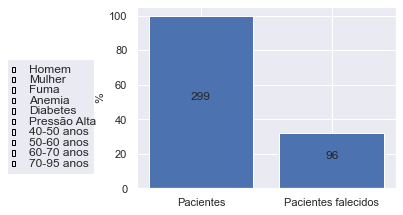

In [ ]:
q = [True, False, False ,False, False, False, False, False, False, False, False]
x = ['Pacientes', 'Pacientes falecidos']
y = [prob1(q), prob2(q)]

fig = plt.figure()
ax = fig.subplots()
plt.subplots_adjust(left = 0.3, bottom = 0.25)
p1, p2 = ax.bar(x, y, label = 'Plot 1')
#plt.ylim((0,100))
ax.set_ylabel('%')

plots =[p1, p2]
activated = [False, False ,False, False, False, False, False, False, False, False] #define quais botões começam ativados
labels = ['Homem','Mulher','Fuma','Anemia','Diabetes','Pressão Alta','40-50 anos','50-60 anos','60-70 anos',
          '70-95 anos']

ax_check = plt.axes([0, 0.3, 0.2, 0.4])
plot_button = CheckButtons(ax_check,labels, activated)

texto = ax.text(.5, 50,'', fontsize=10)

height1 = p1.get_height()
alt1 = ax.text(p1.get_x() + p1.get_width() / 2.0, height1/2, f'{round(qtd_pacientes(q),2)}', ha='center', va='bottom')

height2 = p2.get_height()
alt2 = ax.text(p2.get_x() + p2.get_width() / 2.0, height2/2, f'{round(qtd_mortos(q),2)}', ha='center', va='bottom')

def select_plot(label):
    
    index = labels.index(label)
    q[index+1] = not q[index+1]
    y = [prob1(q), prob2(q)]
    p1.set_height(y[0])
    p2.set_height(y[1])
    texto.set_text(f'Probabilidade de morrer \n {round(prob_morrer(q),2)}%')
       
    alt1.set_position((0,p1.get_height()/2))
    alt2.set_position((1,p2.get_height()/2))
    
    alt1.set_text(f'{round(qtd_pacientes(q),2)}')
    alt2.set_text(f'{round(qtd_mortos(q),2)}')
    
    plt.draw() 

plot_button.on_clicked(select_plot)
plt.show()

# Extras -graficos que não estou usando 

In [ ]:
# Distribuição das idades com relação as mortes

age_vive = heart[heart['DEATH_EVENT']==0]['age']
age_morre = heart[heart['DEATH_EVENT']==1]['age']

dados_distribuicao_age = [age_vive,age_morre]

legenda = ['Sobrevintes', 'Falecidos']
fig1_distribuicao_age = ff.create_distplot(dados_distribuicao_age, legenda, bin_size=0.5)


fig1_distribuicao_age.update_layout(title_text="Distribuição das idades dos pacientes que faleceram/sobreviveram")
fig1_distribuicao_age.show()

![image](https://user-images.githubusercontent.com/71708626/142081551-1a5f7639-d014-4dcb-9533-d72cc8e236e3.png)